# BREAST CANCER WISCONSIN DIAGNOSTIC: Predict whether the tumor is benign or malign

## Student: Bianca Iacomussi s277857
#### 01TXGSM	- MATHEMATICS IN MACHINE LEARNING
##### POLITECNICO DI TORINO
---

# 1. Introduction


**Breast cancer** resulted to be the most common malignancy among women:  overall, it emerges that 1 in 8 women in Italy falls ill with breast cancer in the course of her life, and 1 in 33 women in Italy dies of breast cancer. Nevertheless, even if it is a predominantly female disease, it exists also among men, but fortunately it is very rare.

Breast cancer occurs as a results of abnormal growth of cells in the breast tissue, commonly referred to as a tumor, which can be benign (not cancerous) or malignant (cancerous).
Since malignant tumors, and then cancers, are very dangerous and even deadly, a quick and accurate diagnosis of the tumor is needed. When the most commonly used screening methods, physical examination of the breasts by a doctor and mammography, are inconclusive, a **Fine Needle Aspiration** exam can help to make the diagnosis.

FNA is a diagnostic procedure used to investigate lumps or tumoral masses. In this technique, a thin, hollow needle is inserted into the mass for sampling of cells that, after being stained, are examined under a microscope. A detailed report will then be provided about the type of cells seen in the sample, including any suggestion that the cells might be cancer. A thing to clarify is that having a lump or mass does not necessarily mean that it is cancerous, but it can be also a benign tumor. So, aspirate samples may be classified as:
-	**Inadequate/insufficient**. The sample taken was not adequate to exclude or confirm a diagnosis, maybe because too few cells were collected.
-	**Benign**. The cells are not cancerous and the lump and its growth are under control and has no spread to other areas of the body.
-	**Atypical/indeterminate, or suspicious of malignancy**. The results are unclear: some cells appear abnormal but are not definitely cancerous.
-	**Malignant**. The cells are cancerous, uncontrolled and have the potential or have spread to other areas of the body, with the formation of metastases.

To see in practice, below two microscope images (A and B) show the cell samples taken through Fine Needle Aspiration of an invasive ductal carcinoma in a 33-year-old pregnant patient.

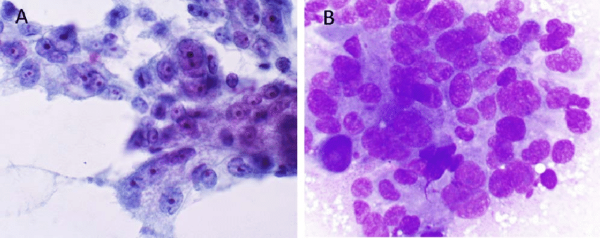

# 2. Purpose
This work is intended to label tumors into benign and malignant on the basis of some microscope images showing cells' samples collected with the FNA procedure. In particular, some features have been extracted by the dataset authors from these pictures to form the **Breast Cancer Wisconsin Diagnostic dataset** under analysis, and they have been exploited to perform **tumor classification** by applying different **Machine Learning algorithms**.

The assignment is all developed in **Python3** on Jupyter notebook, with the use of some libraries. To cite some of them, pandas (for storing structured data in DataFrames), sklearn (to apply machine learning tools), seaborn, plotly and graphviz (for the visualizations). To see the code, click on this button:

In [1]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import seaborn as sns
from pylab import *
import plotly.figure_factory as ff
import numpy as np
from sklearn.neighbors import LocalOutlierFactor
from sklearn.ensemble import IsolationForest
from sklearn import preprocessing
from sklearn.decomposition import PCA
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import KFold
from sklearn.model_selection import ParameterGrid
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.metrics import f1_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from IPython.display import Image
from sklearn import tree
import graphviz
import os
# import base64
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

# 3. Dataset description
**Breast Cancer Wisconsin Diagnostic** dataset was created in 1992 by Dr. William H. Wolberg, physician at the
University Of Wisconsin, Olvi L. Mangasarian professor at Computer Sciences Department at the University Of Wisconsin and his research assistant W. Nick Street, who donated the dataset to the UCI Machine Learning Repository in 1995.
They computed dataset features from digitized images of a fine needle aspirate of a breast mass. With an interactive interface, they initialized active contour models, deformable splines known as snakes, near the boundaries of a set of cell nuclei. Then, thanks to an optimization procedure, customized snakes are deformed to the exact shape of the nuclei, as shown in the figure below. In this image, which is one used in the dataset creation, you can see the initial approximate outline of some cell nucleus boundaries (dotted lines) and the snakes after convergence to the cell nuclei boundaries (solid lines).

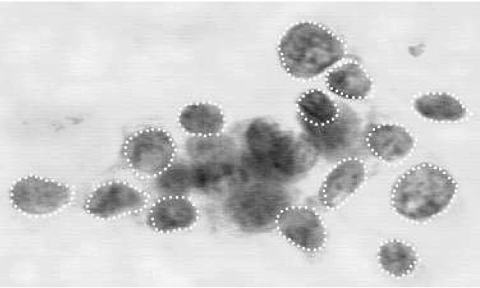

This method allowed to generate automated analysis of ten features of the cell nuclei present in the image. The ten features were computed for each nucleus, and for each feature the **mean** value, largest (or **worst**, because larger values indicate a higher likelihood of malignancy) value and **standard error** are found over the range of isolated cells and then saved in the dataset.
The extracted features are as follows:
* **Radius**, computed as the mean of distances from the centroid of the snake and the individual snake points. 
* **Texture**, measured by finding the variance of the grey scale intensities in the component pixels.
* **Perimeter**, calculated as the total distance between the snake points.
* **Area**, measured simply by counting the number of pixels on the interior of the snake and adding one-half of the pixels in the perimeter. 
* **Smoothness**, quantified by measuring the difference between the length of a radial line and the mean length of the lines surrounding it.
* **Compactness**, computed as $compactness = \frac{{perimeter}^{2}}{area}$
* **Concavity**, to measure the severity of concavities 
* **Concave Points**, to measure the number of contour concavities. 
* **Symmetry**, computed with respect to the longest axis.
* **Fractal Dimension**, to quantify the cell regular contour: higher values corresponds to a less regular contour, so to a higher probability of malignancy.

In the end, the Breast Cancer Wisconsin Diagnostic dataset contains **32 attributes**: **30 real features** descripted above, a **categorical feature** containing the patient ID to which the sample refers and the diagnosis, namely the **class label**, which can be "B" as benign or "M" as malignant. Below, there is the complete list of the attributes: 

In [3]:
cols = ["id", "diagnosis", "radius_mean", "texture_mean", "perimeter_mean", "area_mean", "smoothness_mean", "compactness_mean", "concavity_mean", "concave_points_mean", "symmetry_mean", "fractal_dimension_mean", 
       "radius_se", "texture_se", "perimeter_se", "area_se", "smoothness_se", "compactness_se", "concavity_se", "concave_points_se", "symmetry_se", "fractal_dimension_se",
       "radius_worst", "texture_worst", "perimeter_worst", "area_worst", "smoothness_worst", "compactness_worst", "concavity_worst", "concave_points_worst", "symmetry_worst", "fractal_dimension_worst"]
df = pd.read_csv("wdbc.data", names = cols)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   id                       569 non-null    int64  
 1   diagnosis                569 non-null    object 
 2   radius_mean              569 non-null    float64
 3   texture_mean             569 non-null    float64
 4   perimeter_mean           569 non-null    float64
 5   area_mean                569 non-null    float64
 6   smoothness_mean          569 non-null    float64
 7   compactness_mean         569 non-null    float64
 8   concavity_mean           569 non-null    float64
 9   concave_points_mean      569 non-null    float64
 10  symmetry_mean            569 non-null    float64
 11  fractal_dimension_mean   569 non-null    float64
 12  radius_se                569 non-null    float64
 13  texture_se               569 non-null    float64
 14  perimeter_se             5

Due to the presence of categorical class labels, this dataset is suitable for the **classification task**. Furthermore, it is a small dataset because it contains only **569 rows**, and fortunately it has **no missing values**.
Here, a brief summary describes the main characteristics of the dataset:

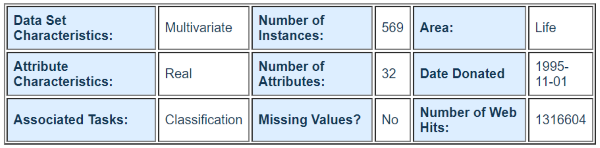

In the following bar plot, the **absolute class frequence** is pictured, presenting a little unbalance in favor of benign samples.

In [4]:
counts = df.groupby("diagnosis").count()["area_se"]
counts = counts.reset_index()
counts.columns = ['Diagnosis', 'Count']
counts = counts.sort_values(['Count', 'Diagnosis'], ascending = False)

fig = go.Figure(data=[go.Bar(
        y=counts["Count"],
        x=counts["Diagnosis"],
#         orientation='v',
        marker_color=['green', 'purple'],
        name = "",
        text=counts["Count"],
        textposition='auto'        
    )])


fig.update_layout(
    autosize = True,
    width = 500,
    height = 300
)

fig.update_yaxes(title_text="Frequency")
fig.update_xaxes(title_text="Diagnosis")
fig.update_layout(title_text="Absolute Frequency of Benign and Malignant Tumors")#, title_y=0.8) #title_x=0.5
fig.show()

The **relative class frequency**, which is about 63/37 (benign/malignant), better shows the extent of the imbalance:

In [5]:
print("Relative frequency:")
print(counts["Count"]/counts["Count"].sum())

Relative frequency:
0    0.627417
1    0.372583
Name: Count, dtype: float64


To begin with, the patient ID column had been dropped from the dataset because this categorical attribute is not needed for the purpose of classification. Then, a quantitative description of the real features follows through several statistical measures:
* **count**: count number of non null observations. Since there are no missing values, count is equal to the number of rows for all the features.
* **mean**: sample mean $\bar{x} = \frac{1}{n}\sum\limits_{i=1}^nx_i$, it is the estimator for the mean.
* **std**: sample standard deviation $s = {\sqrt{\frac{1}{n-1}\sum\limits_{i=1}^n(x_i-\bar{x})^2}}$, it is the unbiased estimator for the standard deviation
* **min**: minimum value
* **25%**: corresponds to the first quartile
* **50%**: is the second quartile, which coincide with the median
* **75%**: is the third quartile
* **max**: maximum value

In [6]:
y = df.loc[:, "diagnosis"]
df = df.drop(columns=["id"])
df = df.reindex(sorted(df.columns), axis=1)
descr = df.describe()
descr

,area_mean,area_se,area_worst,compactness_mean,compactness_se,compactness_worst,concave_points_mean,concave_points_se,concave_points_worst,concavity_mean,...,radius_worst,smoothness_mean,smoothness_se,smoothness_worst,symmetry_mean,symmetry_se,symmetry_worst,texture_mean,texture_se,texture_worst
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,654.889104,40.337079,880.583128,0.104341,0.025478,0.254265,0.048919,0.011796,0.114606,0.088799,...,16.269190,0.096360,0.007041,0.132369,0.181162,0.020542,0.290076,19.289649,1.216853,25.677223
std,351.914129,45.491006,569.356993,0.052813,0.017908,0.157336,0.038803,0.006170,0.065732,0.079720,...,4.833242,0.014064,0.003003,0.022832,0.027414,0.008266,0.061867,4.301036,0.551648,6.146258
min,143.500000,6.802000,185.200000,0.019380,0.002252,0.027290,0.000000,0.000000,0.000000,0.000000,...,7.930000,0.052630,0.001713,0.071170,0.106000,0.007882,0.156500,9.710000,0.360200,12.020000
25%,420.300000,17.850000,515.300000,0.064920,0.013080,0.147200,0.020310,0.007638,0.064930,0.029560,...,13.010000,0.086370,0.005169,0.116600,0.161900,0.015160,0.250400,16.170000,0.833900,21.080000
50%,551.100000,24.530000,686.500000,0.092630,0.020450,0.211900,0.033500,0.010930,0.099930,0.061540,...,14.970000,0.095870,0.006380,0.131300,0.179200,0.018730,0.282200,18.840000,1.108000,25.410000
75%,782.700000,45.190000,1084.000000,0.130400,0.032450,0.339100,0.074000,0.014710,0.161400,0.130700,...,18.790000,0.105300,0.008146,0.146000,0.195700,0.023480,0.317900,21.800000,1.474000,29.720000
max,2501.000000,542.200000,4254.000000,0.345400,0.135400,1.058000,0.201200,0.052790,0.291000,0.426800,...,36.040000,0.163400,0.031130,0.222600,0.304000,0.078950,0.663800,39.280000,4.885000,49.540000


Below univariate distributions of the features are shown my means of **distplot** function. It draws a histogram and fit a kernel density estimate (KDE). A histogram is way to represent the distribution of data by forming bins along the range of the data and then drawing bars to show the number of observations that fall in each bin. The kernel density estimate is also useful for plotting the shape of a distribution and for encoding the density of observations. To draw a KDE, each observation is first replaced with a Gaussian curve centered at that value. Next, these curves are summed to compute the value of the density at each point. The resulting curve is then normalized so that the area under it is equal to 1.

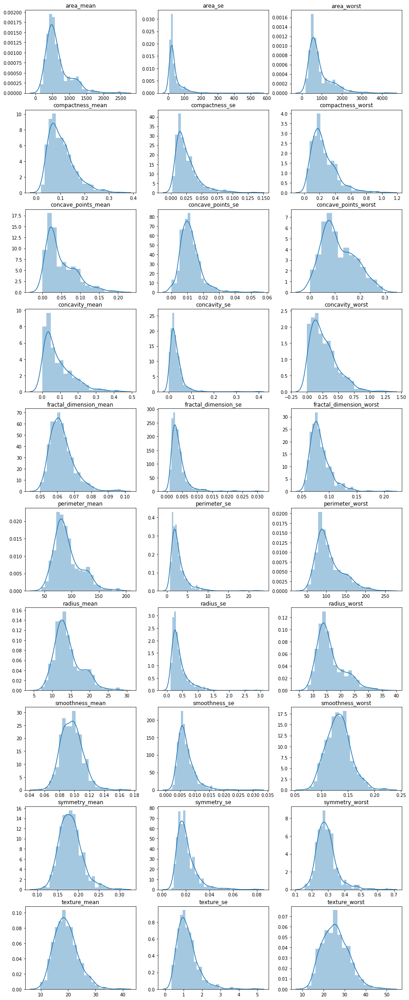

In [7]:
fig,axes=plt.subplots(10,3, figsize=(15, 40))
i=0
for c in df.columns[0:]:
    if c!="diagnosis":
        row = int(i/3)
        col = i%3
        sns.distplot(df[c],ax=axes[row][col])
        axes[row][col].set(title=c, xlabel="")
        i=i+1
plt.show()

At a first sight, it is noticeable that many univariate distributions are not symmetric but have a positive skew, because the right tail is longer and the mass of the distribution is concentrated on the left of the figure. Furthermore, the features have diverse ranges of values, even of different orders of magnitude, as it is confirmed also in the **boxplots** below.

The boxplots visualization is made difficult because of the diverse scales of the features: a standardization will subsequently be necessary to rescaling the measures.

In [8]:
fig = go.Figure()

for c in df.columns[0:]: 
    if c!="diagnosis":
        fig.add_trace(go.Box(y = df[c], name = c))
    
fig.update_layout(
    title = "Features boxplots"
) 

fig.show()

# 4. Data preprocessing and further visualizations

## 4.1 Feature correlation
An important aspect that can have an impact in the classification task is feature correlation. In this work, linear correlation among all feature pairs has been computed by means of **Pearson's correlation coefficient**.
The latter, when applied to a sample, is represented by the ratio between the sample covariance and the product of sample standard deviations:

${\displaystyle r_{xy} = \frac{\sum\limits_{i=1}^n(x_i-\bar{x})(y_i-\bar{y})}{\sqrt{\sum\limits_{i=1}^n(x_i-\bar{x})^2}\sqrt{\sum\limits_{i=1}^n(y_i-\bar{y})^2}}}$ 

where $n$ is the sample size, $x_i$, $y_i$ are the individual values of the features $x$ and $y$, and $\bar{x}$, $\bar{y}$ are the sample means.

The correlation coefficient is a number between -1 and 1:
* When $r_{xy}=1$, a linear equation describes the relationship between $x$ and $y$ perfectly, and when $x$ increases also $y$ increases. This is a case of positive correlation.
* When $r_{xy}=-1$, there is a perfect linear relationship between $x$ and $y$, so that when $x$ increases, $y$ decreases. So, $x$ and $y$ are negatively correlated.
* When $r_{xy}=0$, $x$ and $y$ are uncorrelated, namely there is no linear relationship between them.

Below it is shown the **correlation matrix** of the dataset features, visualized as a heatmap. You can notice that there are several highly positive correlated features, pictured in dark green. Area_mean, perimeter_mean and radius_mean are some of these, as you would expect, since geometrically related to each other.

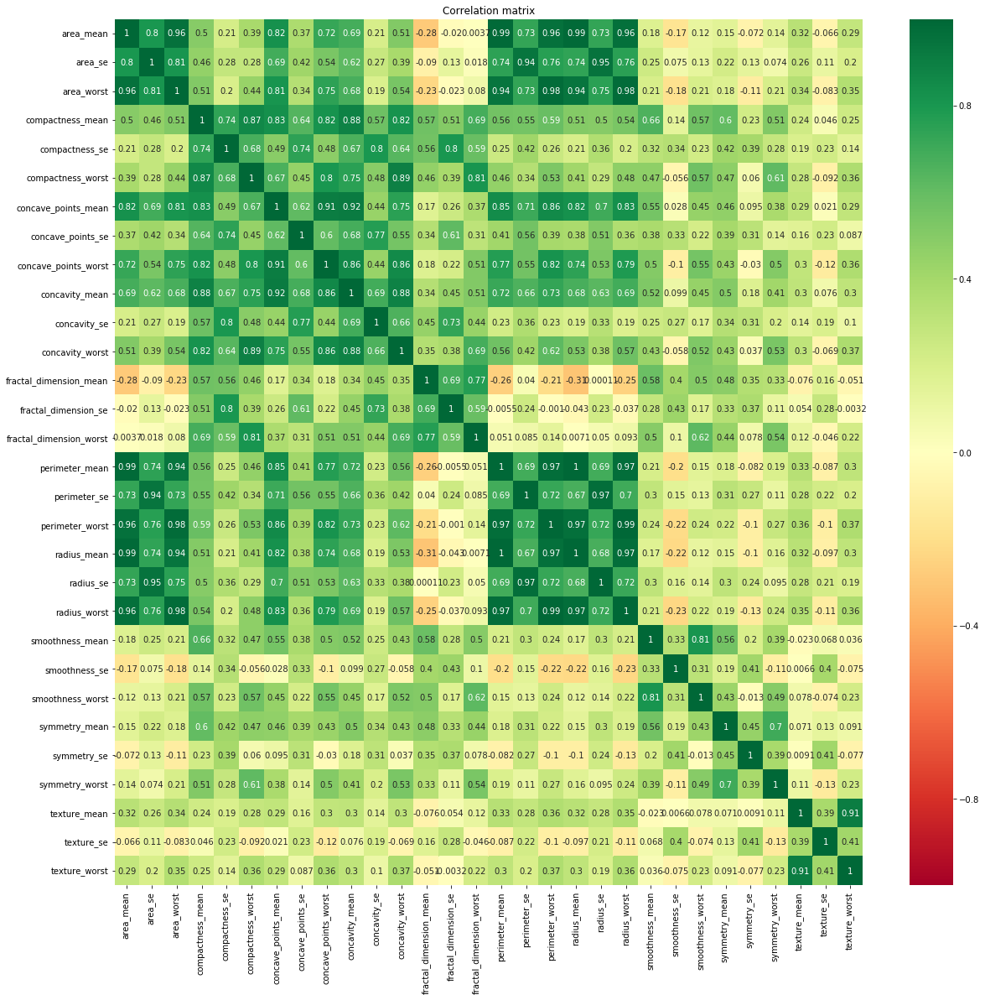

In [9]:
fig, ax = plt.subplots(figsize = (20, 19))
ax = sns.heatmap(df.drop('diagnosis', axis = 1).corr(), annot = True, cmap = "RdYlGn", vmin = -1, vmax = 1)
plt.title("Correlation matrix")
plt.show()

In [10]:
cm = df.drop('diagnosis', axis = 1).corr()
correlated_features = set()
for i in range(len(cm.columns)):
    for j in range(i):
        if abs(cm.iloc[i, j]) >= 0.9:
            colname = cm.columns[i]
            correlated_features.add(colname)
df.drop(labels=correlated_features, axis=1, inplace=True)

**Highly correlated features** in general do not improve models, rather they make models redundant. As it is suggested by the **Occam's razor**, *Frustra fit per plura quod fieri potest per pauciora*, translated "it is futile to do with more things that which can be done with fewer". This means that in general a simpler model is preferable, and, applied to machine learning, a model with fewer features is simpler and then preferable.
So, a good option is to remove one of the highly correlated features, which has also the advantages to increase the interpretability of the model (for decision tree and random forest) and to make the learning algorithm faster.

In doing this, a **threshold** has been put in order to cut features with a correlation coefficient greater than or equal to 0.9 or smaller than or equal to -0.9. Finally, the correlation heatmap after the feature selection is visualized.

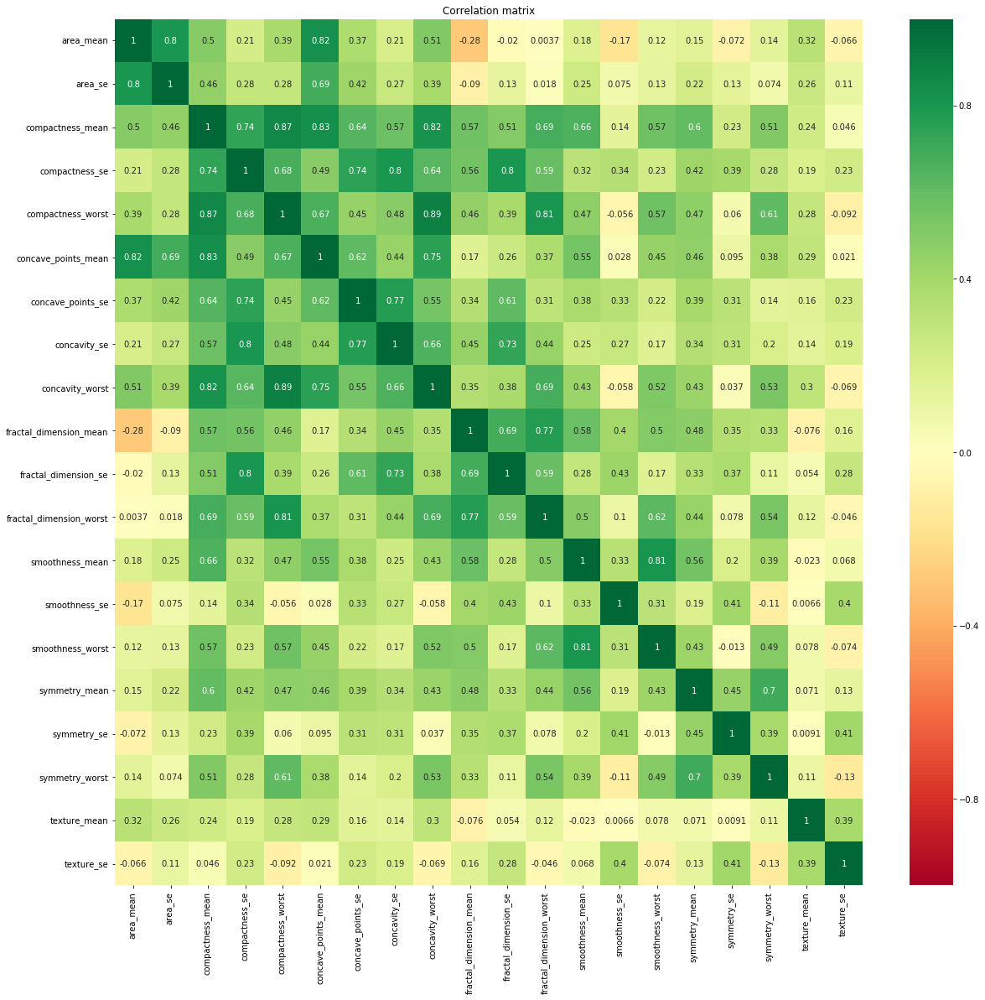

In [11]:
fig, ax = plt.subplots(figsize = (20,19))
ax = sns.heatmap(df.drop('diagnosis', axis = 1).corr(), annot = True, cmap = "RdYlGn", vmin = -1, vmax = 1)
plt.title("Correlation matrix")
plt.show()

In practice, 20 of 30 features are remained in the dataset. Now that the number of features is relatively smaller, a further visualization becomes possibile, which was not feasible before: below pairplots are shown to better understand the mutual relationships between the features.

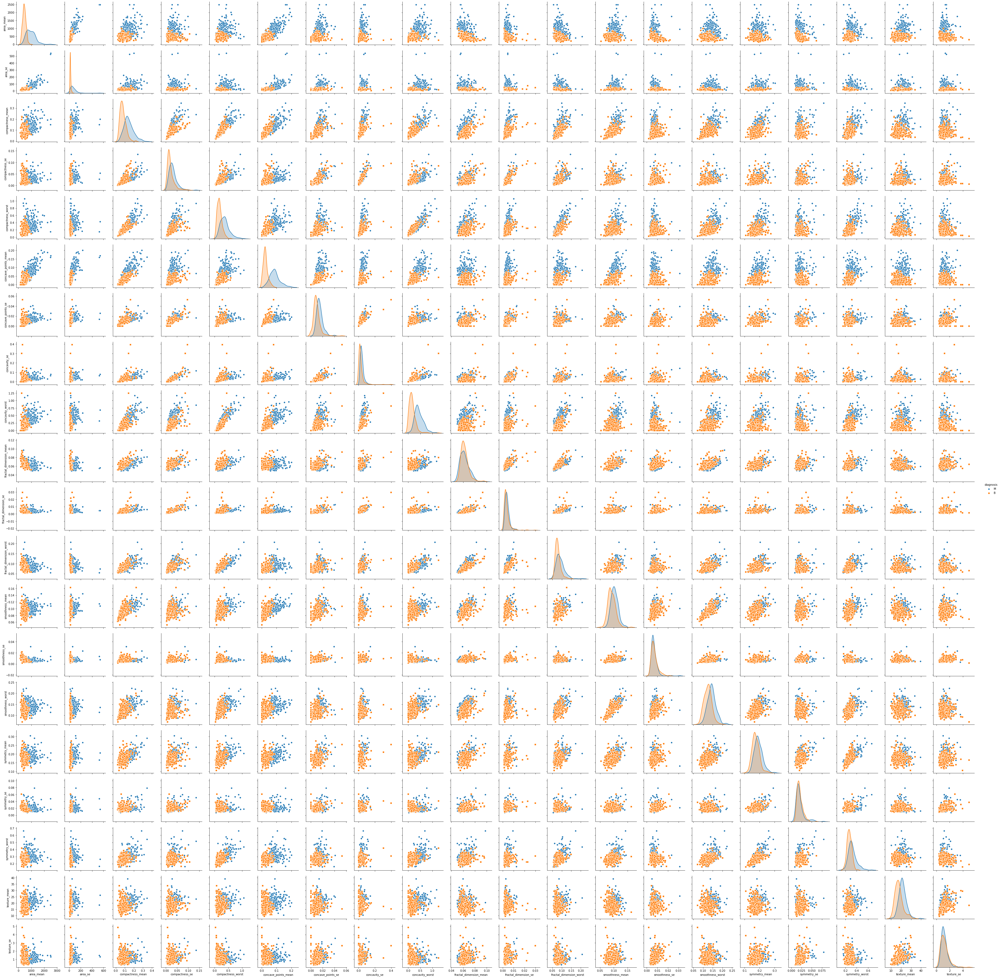

In [12]:
g = sns.pairplot(df, hue="diagnosis", markers=["o", "s"])

In the **pairplot**, you can notice that some feature pairs are still positive correlated since the set of relative dots has an elonged shape. This is the case of the pair concavity_worst and compactness_worst, which has a Pearson's correlation coefficient of 0.89, as written in the correlation matrix above. A further comment which can be made is that some features may be suitable to distinguish among the two labels (area_mean, area_se and concave_points_mean): in their pairplots the classes appear separated and their distributions are not so much overlapped.

## 4.2 Outlier Detection
An important step in the preprocessing pipeline is outlier detection. **Outliers** are points that significantly differ from other observations. There are **various kinds** of outliers, such as:
* *contextual outliers* (their value significantly deviates from the rest of the data points in the same context)
* *collective outliers* (their values as a collection deviate significantly from the entire dataset, but the values of the individual data points are not themselves anomalous in either a contextual or global sense)
* *point outliers* (their values are diverse with respect to the overall data distribution). 

Furthermore, outliers can result from **different causes**, such as typing errors, measurement or experimental errors, sampling errors, presence of novelties, etc.

In the case of the dataset under analysis, some outliers were noticed looking at the **boxplots** (zooming in for too small boxes): they are the points out of the range $[Q1-1.5*IQR, Q3+1.5*IQR]$, where $IQR$ is the interquartile range, $Q3-Q1$. The great majority of these outliers are points with too high values of the respective feature. Probably they may be point outliers, perhaps originated from experimental error when the dataset features were created. However, as the authors of the dataset suggested, extreme values are the most intuitively useful for the problem. So, only a domain expert could safely indicate the points as outliers, and for this reason, being in doubt, great care was taken in removing the outliers. Two scenarios were evaluated: the first in which they were not removed and the second in which the **Local Outlier Factor** technique was adopted to cut out them.

### 4.2.1 Local Outlier Factor
The **Local Outlier Factor** (LOF) algorithm is an unsupervised anomaly detection method which compares the local density of a given data point with respect to the local densities of its k nearest neighbors. It considers as outliers the points that have a substantially lower density with respect to their neighbors. 
To calculate the LOF several measures need to be considered:
* First of all, it is necessary to **choose k**, the number of nearest neighbors
* Define the **k-distance** $dist_k(a)$. It is the distance of a point $a$ to its k-th neighbor
* Determine the **reachability distance** which is simply the maximum of the distance of two points and the k-distance of the second point: 

    $reach-dist_k(a, b) = max{\{d(a,b), dist_k(b)}\}$
    
    In few words, if point $a$ is within the k neighbors of point $b$, $reach-dist(a,b)$ will be the k-distance of $b$. Otherwise, it will be the real distance of $a$ and $b$.
    The image below shows this concept in the case of k=3. Points B and C have the same reachability distance from A $reach-dist_k(B, A) = reach-dist_k(C, A) = dist_k(A)$, because they are within the k nearest neighbors. Instead, for D the following holds: $reach-dist_k(D, A) = d(D,A)$
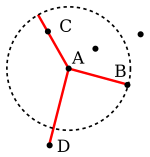


* Then, the **Local Reachability Density** is computed. To get the LRD for a point $a$, you first compute the reachability distance of $a$ to all its k nearest neighbors and calculate the average of that number. Finally, you take the inverse of the average.

    $LRD(a) = \frac{1}{\frac{1}{k}\sum\limits_{a_i∈N_k(a)}reach-dist(a, a_i)}$

    LRD is a density, hence it measures sparseness. The longer the distance to the next neighbors, the sparser the area the respective point is located in.

Having clarified how to define the Local Reachability Density, it is possibile to give the definition of the LOF, since it compares the LRD of each point to the LRD of their k neighbors. Basically, the **Local Outlier Factor** is computed as the average ratio of the LRDs of the neighbors of $a$ to the LRD of $a$.

$LOF(a) = \frac{1}{k}\sum\limits_{i=1}^k\frac{LRD(a_i)}{LRD(a)}$

The lower the local reachability density of $a$, and the higher the local reachability density of the k neighbors of $a$, the higher LOF.
A practical rule to detect the outliers is to find points with **LOF>>1**. This means that the density of the point is much smaller than the densities of its neighbors, so the point is far from dense areas and it is isolated, so it is considered as an outlier.
As an example, in the image below you can see that the point A has a much lower density than its neighbors. This is intuitively visualized by the dashed circles, which are more dense in the case of the neighbors of A.
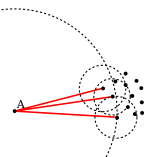

In this work, for applying the LOF it has been used the Sklearn implementation. It has been decided not to tune k because the nature itself of the algorithm: in an unsupervised setting, it would be difficult to evaluate how much the choice of k positively influenced the classification results.
However, the outlier removal caused the dataset size to pass from 569 entries to 538, cutting out 31 points.

In [13]:
X = df[df.drop(columns=["diagnosis"]).columns[0:]]
X = df.drop(columns=["diagnosis"])
yy = df['diagnosis']
clf = LocalOutlierFactor(n_neighbors=20) #10
lof = clf.fit_predict(X)
lof_df = df[lof==1] #inliers

## 4.3 Z-score normalization
Due to the different scales in the features, the data (both the datasets with and without outliers) has been standardized through the standard score normalization. In this case, where the data distribution is unknown, the standard score normalization consists in subtracting the sample mean $\bar{x}$ and dividing by the sample standard deviation $S$ as estimates of the population values. The $x$ values are substituted by the **z-scores**:
${\displaystyle z={x-{\bar {x}} \over S}}$.
After doing this, the data is centered with empirical mean 0 and empirical standard deviation 1.

In [14]:
X_lof = lof_df[lof_df.drop(columns=["diagnosis"]).columns[0:]]
y_lof = lof_df['diagnosis']

# Get column names first
names = X.columns
# Create the Scaler object
scaler = preprocessing.StandardScaler()
# Fit your data on the scaler object
scaled_df = scaler.fit_transform(X)
scaled_df = pd.DataFrame(scaled_df, columns=names)

Now that the normalization had been applied to the dataset, it is possibile to better visualize feature **boxplots**:

In [15]:
fig = go.Figure()

for c in scaled_df.columns[0:]: 
    fig.add_trace(go.Box(y = scaled_df[c], name = c))
    
fig.update_layout(
    title = "Features boxplots after Standardization"
) 

fig.show()

In [16]:
# Get column names first
names = X_lof.columns
# Create the Scaler object
scaler = preprocessing.StandardScaler()
# Fit your data on the scaler object
scaled_lof_df = scaler.fit_transform(X_lof)
scaled_lof_df = pd.DataFrame(scaled_lof_df, columns=names)

These are the feature **boxplots** generated from the dataset **after the use of LOF**:

In [17]:
fig = go.Figure()

for c in scaled_lof_df.columns[0:]: 
#     if c!="area_mean" and c!="area_se" and c!="diagnosis" and c!="texture_mean" and c!="texture_se":
    fig.add_trace(go.Box(y = scaled_lof_df[c], name = c))
    
fig.update_layout(
    title = "Features boxplots after LOF and Standardization"
) 

fig.show()

## 4.4 Dimensionality reduction
After data normalization, a dimensionality reduction of the two versions of the dataset have been evaluated with the use of Principal Component Analysis, to understand if decreasing the dimensionality could effectively be benefical to the final prediction model. Dimensionality reduction is the procedure to **map data in high dimensional space, into a lower dimensional space**. This is useful because it can reduce training and testing computation time, because it is a valid tool for subsequent data visualization and it can reduce the curse of dimensionality.

### 4.4.1 The curse of dimensionality
Occurring when the number of dimensions is huge or when we have few data with respect to the number of features, the curse of dimensionality causes points to be very sparse and isolated in high dimensional spaces. As a consequence, every observation in the dataset appears equidistant from all the others, making meaningless some algorithms like KNN and SVM. Moreover if the number of features is greater than the number of observations, there is a high risk of overfitting the model. To escape from this problem, a number of samples which grows exponentially with the dimension is needed, or some techniques of dimensionality reduction can be applied, e.g. PCA. 

### 4.4.2 PCA
Let $x_1,...,x_m$ be $m$ vectors in ${\rm I\!R}^d$, where in this case $d$ is the number of features and $m$ is the number of instances in the dataset. The aim is to reduce the dimensionality of these vectors from $d$ to $n<d$, using a linear transformation.
In order to do this, two matrices are considered: the compression matrix $W$ and the recovering matrix $U$.

The matrix $W ∈ {\rm I\!R}^{n,d}$ induces a mapping $x → Wx$, where $Wx ∈ {\rm I\!R}^n$ is the lower dimensionality representation of $x$.
The recovering matrix $U ∈ {\rm I\!R}^{d,n}$ can be used to (approximately) recover each original vector $x$ from its compressed version. Given a compressed vector $y ∈ {\rm I\!R}^n$ such that $y= Wx$, we can construct $x̃ = Uy$, so that $x̃$ is the recovered version of $x$ and resides in the original high dimensional space ${\rm I\!R}^d$.

In PCA, we find the **compression matrix** $W$ and the **recovering matrix** $U$ so that the total squared distance between the original and recovered vectors is minimal:

$\underset{W ∈ {\rm I\!R}^{n,d}, U ∈ {\rm I\!R}^{d,n}}{\operatorname{argmin}} \sum\limits_{i=1}^m||x_i-UWx_i||^2$

After some computations, it can be demonstrated that the problem can be rewritten in the equivalent form:

$\underset{U ∈ {\rm I\!R}^{d,n}, U^TU=I}{\operatorname{argmax}} trace(U^TAU)$

where $A = \sum\limits_{i=1}^m{x_ix_i^{T}}$. Then, the solution to the PCA optimization problem is the matrix $U = [u_1, u_2, ..., u_n]$, whose columns $u_i$ are the $n$ eigenvectors of $A$, corresponding to the largest $n$ eigenvalues, and they are called **principal components**.

Generally, data is centered before applying PCA. To do this, $\mu = \frac{1}{m}\sum\limits_{i=1}^m{x_i}$ is computed and subracted to the data. So, PCA is utilized on the vectors $(x_1-\mu),...,(x_m-\mu)$. In this case, PCA can be interpreted as variance maximization, in the sense that the first PC $u_1$ captures as much variability in $x_1,...,x_m$ as possible, and subsequent PCs will take up successively smaller parts of the total variance.
<img scr="my_PCA.PNG" width="200">

For illustrative purposes, PCA with 2 and 3 components has been applied to the normalized dataset and to the normalized dataset with outliers removal. So, 2D and 3D visualization of the data in the two scenarios are presented below:

In [18]:
pca = PCA(n_components = 2)
pcs = pca.fit_transform(scaled_df)
# scores = np.matmul(np.array(X).T, pcs)
pc1, pc2 = pcs.T #transpose

dtype = ["Starting Data" for i in range(len(pc1))]

pca_lof = PCA(n_components = 2)
pc1_lof, pc2_lof = pca_lof.fit_transform(scaled_lof_df).T
dtypelof = ["Local Outlier Factor" for i in range(len(pc1_lof))]

pc1full = list(pc1) + list(pc1_lof)
pc2full = list(pc2) + list(pc2_lof)
labelsfull = list(y) + list(y_lof)
dtypefull = dtype + dtypelof

df2D = pd.DataFrame()
df2D['pc1'] = pc1full
df2D['pc2'] = pc2full
df2D['diagnosis'] = labelsfull
df2D['dtype'] = dtypefull

# da qui puoi cancellare
fig = px.scatter(df2D, x = "pc1", y = "pc2", color_discrete_map = {"M": "purple", "B": "orange"}, color = "diagnosis", animation_frame = "dtype")
fig.update_layout(
    title = "PCA with 2 components",
    xaxis_title = "First Principal Component",
    yaxis_title = "Second Principal Component",
    yaxis=dict(
       autorange = True,
       fixedrange= False
   )
)
# fig.update_layout(annotations = score_vectors)
fig.show()

In [19]:
pca = PCA(n_components = 3)
pc1, pc2, pc3 = pca.fit_transform(scaled_df).T
dtype = ["Normalized Data" for i in range(len(pc1))]

pca_lof = PCA(n_components = 3)
pc1_lof, pc2_lof, pc3_lof = pca_lof.fit_transform(scaled_lof_df).T
dtypelof = ["Normalized Local Outlier Factor" for i in range(len(pc1_lof))]

pc1full = list(pc1) + list(pc1_lof)
pc2full = list(pc2) + list(pc2_lof)
pc3full = list(pc3) + list(pc3_lof)
labelsfull = list(yy) + list(y_lof)
dtypefull = dtype + dtypelof

df3D = pd.DataFrame()
df3D['1st PC'] = pc1full
df3D['2nd PC'] = pc2full
df3D['3rd PC'] = pc3full
df3D['diagnosis'] = labelsfull
df3D['dtype'] = dtypefull

fig = px.scatter_3d(df3D, x = "1st PC", y = "2nd PC", z = "3rd PC", color = "diagnosis", color_discrete_map = {"M": "purple", "B": "orange"}, animation_frame = "dtype")
fig.update_layout(
    height = 800,
    title = "PCA with 3 componenents", title_x=0.5
)
fig.show()

It is clear from the plots that there are not many differences among the application of PCA in the two scenarios. However, it noticeable that in all the cases the data appear approximately linearly separable.

Now, it has to be decided how many components are sufficient to summarize the data. In order to do this, the notion of **Proportion of Variance Explained** has to be considered. The PVE is useful to understand the strength of each principal components in explaining the variability and it is defined as the ratio between the variance explained by the j-th principal component $u_j$ and the total variance present in the dataset:

${{PVE}}_j = \frac{\frac{1}{m-1}\sum\limits_{i=1}^{m}(x_iu_j)^2}{\frac{1}{m-1}\sum\limits_{j=1}^{d}\sum\limits_{i=1}^{m}x_{ij}^2}$

where $X ∈ {\rm I\!R}^{m,d}$ is the matrix which represent the dataset ($m$ instances, $d$ features).
In practice, the PVE has been computed for all the $d$ components, together with the cumulative which gives the percentage of variance accounted for by the first n components. After that, a **pareto chart** has been constructed in order to find the best number of components:

In [20]:
fig = make_subplots(
    rows = 1,
    cols = 2,
#     specs = [[{"type": "bar"}, {"type": "bar"}, {"type": "bar"}]],
#     column_widths = [0.33, 0.33, 0.33],
    subplot_titles=("Normalized Data", "Normalized + Local Outlier Factor")
)

pca = PCA(n_components = 20)
pca.fit(scaled_df)
cumulative = [pca.explained_variance_ratio_[:i+1].sum() for i in range(len(pca.explained_variance_ratio_))]

pca_lof = PCA(n_components = 20)
pca_lof.fit(scaled_lof_df)
cumulative_lof = [pca_lof.explained_variance_ratio_[:i+1].sum() for i in range(len(pca_lof.explained_variance_ratio_))]

fig.add_trace(
    go.Bar(x = list(range(1, 21)), y = pca.explained_variance_ratio_, name = 'individual', marker_color = 'darkblue', showlegend = False),
    row = 1,
    col = 1
)
fig.add_trace(
    go.Scatter(x = list(range(1, 21)), y = cumulative, mode='lines+markers', name = 'cumulative', marker_color = 'darkorange', showlegend=False),
    row = 1,
    col = 1
)

fig.add_trace(
    go.Bar(x = list(range(1, 21)), y = pca_lof.explained_variance_ratio_, name = 'individual', marker_color = 'darkblue', showlegend = False),
    row = 1,
    col = 2
)
fig.add_trace(
    go.Scatter(x = list(range(1, 21)), y = cumulative_lof, mode='lines+markers', name = 'cumulative',  marker_color = 'darkorange', showlegend = False),
    row = 1,
    col = 2
)

fig.update_layout(
    height = 400,
    title = "Explained variance by different principal components",
    yaxis_title = "Explained variance in percent",
#     xaxis_title = "Principal component",
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    ),
#     yaxis2_title = "PVE",
    xaxis2_title = "Principal component",
    xaxis2 = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    ),
#     yaxis3_title = "PVE",
#     xaxis3_title = "Principal component",
    xaxis3 = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)    

fig.show()

Looking for an elbow in the cumulative (the orange line), it has been chosen $n = 6$ as number of dimensions. This choice seems appropriate, taking into account that the cumulative PVE is $\approx87\%$.

In [21]:
pca0 = PCA(n_components = 6)
pca_X = pca0.fit_transform(scaled_df)
pca_X = pd.DataFrame(data=pca_X)
pca2 = PCA(n_components = 6)
pca_lof_X = pca2.fit_transform(scaled_lof_df)
pca_lof_X = pd.DataFrame(data=pca_lof_X)

## 4.5 Oversampling: SMOTE
To solve the problem of the **unbalancing**, it has been decided to adopt an oversampling technique, due to the small size of the dataset. In fact, an alternative would have been using **undersampling**, that means to delete examples from the majority class, which is not a good idea when we have few data. Instead, with **oversampling** you can create synthetical observations or copies of the minority class based on the available data. The two concepts are illustrated in the figure below:
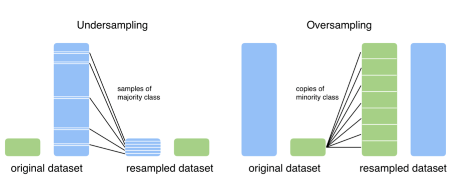

However, the oversampling method exploited in this work is called **SMOTE**, Synthetic Minority Over-sampling TEchnique, and has a simple mechanism.
To synthetize new points, SMOTE takes a sample from the minority class and it considers its k nearest neighbors in the feature space, belonging to the same class. Then, it takes the vector between one of those k neighbors, and the current data point. After that, it multiplies the vector by a random number between 0 and 1, and adds this to the current data point to create the new synthetic data point. In the end, the resampled dataset has perfectly balanced classes (50/50).

This animated image pictures the functioning:

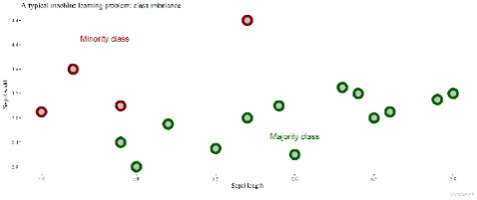

In [22]:
def score_model_smote(model, params, X_train, y_train):
    
    cv = KFold(n_splits=5, random_state=42) #5

    smoter = SMOTE(random_state=42)
    
    scores = []
    models = []
    configs = []
    
    idx = np.arange(0, X_train.shape[0])
    
    X_train.set_index(idx, inplace=True)

    y_train = y_train.reset_index()
    y_train = y_train.drop(columns=["index"])
    
    for train_fold_index, val_fold_index in cv.split(X_train, y_train):
        X_train_fold, y_train_fold = X_train.reindex(train_fold_index), y_train.reindex(train_fold_index) 
        X_val_fold, y_val_fold = X_train.reindex(val_fold_index), y_train.reindex(val_fold_index)       
        X_train_fold_upsample, y_train_fold_upsample = smoter.fit_resample(X_train_fold,
                                                                           y_train_fold)
        for config in ParameterGrid(params):
            model_obj = model(**config).fit(X_train_fold_upsample, y_train_fold_upsample)
            score = f1_score(y_val_fold, model_obj.predict(X_val_fold), average="micro")
            scores.append(score)
            models.append(model_obj)
            configs.append(config)
    scores = np.array(scores)
    max_index = np.argmax(scores)
    best_score = scores[max_index]
    best_model = models[max_index]
    best_params = configs[max_index]
#     print(best_params)
    return best_score, best_model, best_params

# 5. Model evaluation strategy

## 5.1 Split the data
First of all, the data has been splitted into *train* and *test* set, with proportions 3:1, fixing a random seed to make the experiments replicable. Since labels are not perfectly balanced, a **stratified shuffle split** has been performed in order to preserve the proportions of the labels in the two sets. The image below illustrates the latter concept:
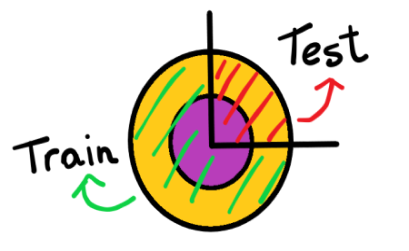
The data splitting has been done for all the scenarios resulting from all the possible combinations of the methods seen before: normalized data; LOF; LOF + PCA; PCA; SMOTE; LOF + SMOTE; PCA + SMOTE; LOF + PCA + SMOTE (in all the cases data is normalized).
## 5.2 K-fold cross validation
To evaluate models by tuning different parameter sets, stratified **K-Fold Cross Validation** was used through the method GridSearchCV. Given a classification algorithm, you choose a set of values for some predetermined hyperparameters of the classificator. Through K-Fold Cross Validation, the train set is divided into K partitions: one partition is considered as the validation set, while the union of the others (k -1) is the train set. Then, the classification model is evaluated with a chosen metric, by training on the train set and testing on the validation set. The all K possible combinations of the partitions as train and validation sets are evaluated and then the average of the metrics across all combinations is computed. All this procedure is repeated for different values of the hyperparameters.
After that, a new model is fit on the entire outer training set, using the best set of hyperparameters from the cross-validation, while the performance of this model is then evaluated using the outer test set.

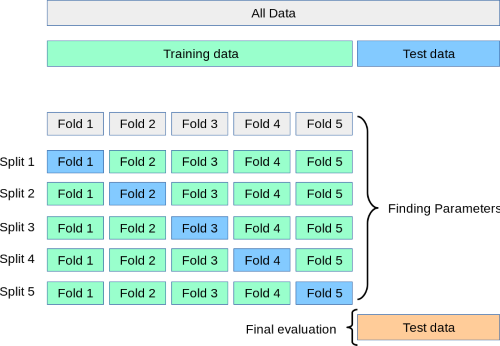

In the scenarios which involve SMOTE oversampling, a slight different procedure is applied because K-fold Cross validation by means of GridSearchCV cannot be used anymore. The reason is that oversampling must be done from the training data alone, keeping the validation and test sets unchanged. GridSearchCV does not allow you to resample just the training set, so a step-by-step process was built. The oversampling procedure is performed during cross-validation: the dataset is first divided into k stratified partitions and only the training set (the union of k-1 partitions) is oversampled. In this scenario, the points included in the validation set are never oversampled or seen by the model in the training stage, thus allowing a proper evaluation of the model's capability to generalize from the training data. The figure below pictures the procedure:

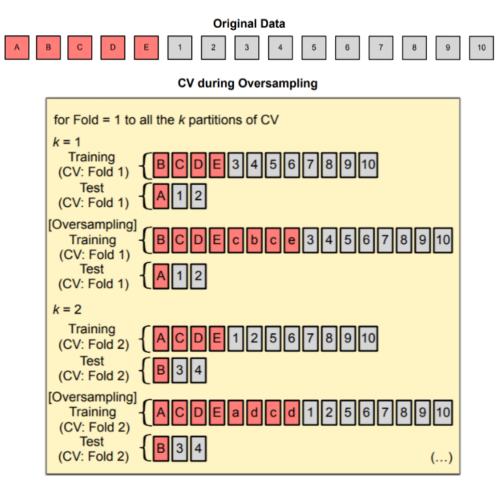

After that, a new model is fit on the entire outer oversampled training set, using the best set of hyperparameters from the cross-validation, while the performance of this model is then evaluated using the outer test set.

In all cases, it has been selected $K = 5$, which is a good compromise between consistency of the assessment and execution time.

 
## 5.3 Metrics
The metric used in models evaluation is **F1-score**, which is the best metric when the false negatives and false positives are crucial, as in this case. A false positive result can cause the patient to start a wrong medicine therapy, while a false negative can cause the patient with cancer to not be treated.
The confusion matrix below shows all the cases which can result:
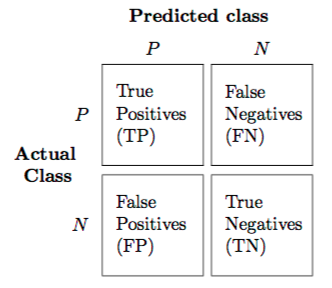
* **True Positive (TP)**: Correctly predicted positive values. Both of predicted and actual values are positive.
* **True Negative (TN)**: Correctly predicted negative values. Both of predicted and actual values are negative.
* **False Positive (FP)**: Wrongly predicted positive values. When actual class is negative but predicted class is positive. It is also called type I error.
* **False Negative (FN)**: Wrongly predicted negative values. When actual class is positive but predicted class is negative. It is also called type II error.

Having clarified this, it is possible to give the definitions of precision, recall and F1-score:

**Precision** is the number of true positives divided by the number of all positive results. It is an appropriate measure when we are interesting in minimizing false positives.

$precision = \frac{TP}{TP + FP}$

**Recall** is the number of true positives divided by the number of all tests that should have been positive (i.e. true positives plus false negatives). It is an appropriate measure to use when we are interesting in minimizing false negatives.

$recall = \frac{TP}{TP + FN}$

**F1-score** is the harmonic mean of precision and recall and it is a good measure to use if we are looking for a balance between the two.

$F1 = 2*\frac{precision*recall}{precision+recall}$

In [23]:
def get_split(X, y):
    sss = StratifiedShuffleSplit(n_splits = 1, test_size = 0.25, random_state = 13)
    train_index, test_index = next(sss.split(X, y))
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    return X_train, X_test, y_train, y_test

X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test = get_split(scaled_df, yy)

X_lof_train, X_lof_test, y_lof_train, y_lof_test = get_split(scaled_lof_df, y_lof)

X_pca_train, X_pca_test, y_pca_train, y_pca_test = get_split(pca_X, yy)

X_pca_lof_train, X_pca_lof_test, y_pca_lof_train, y_pca_lof_test = get_split(pca_lof_X, y_lof)


variants = []
algorithms = []
hyperparameters = []
best_cv_scores = []
f1_test_scores = []

# 6. Classification models
Several machine learning algorithms have been used in the classification task:
* K-Nearest Neighbors
* Support Vector Machines
* Decision Tree
* Random Forest
* Logistic Regression

From now on, the plots and results obtained refer to the normalized dataset. 

In [24]:
def learningCurves(X_train, X_test, y_train, y_test, model, params):

    x_axis = np.linspace(0.1, 0.9, 9)
    train_F1 = []
    val_F1 = []

    for i in x_axis:

        sss_lcurve = StratifiedShuffleSplit(n_splits = 1, test_size = i, random_state = 42)
        _, idx = next(sss_lcurve.split(X_train, y_train))
        X_partition = X_train.iloc[idx]
        y_partition = y_train.iloc[idx]

        clf = model(**params)
        clf.fit(X_partition, y_partition)
        y_pred_part = clf.predict(X_partition)
        y_pred_test = clf.predict(X_test)

        train_F1.append(f1_score(y_partition, y_pred_part, average = 'micro'))
        val_F1.append(f1_score(y_test, y_pred_test, average = 'micro'))

    clf = model(**params)
    clf.fit(X_train, y_train)

    x_axis = list(x_axis)
    x_axis.append(1)
    y_pred_part = clf.predict(X_train)
    y_pred_test = clf.predict(X_test)

    train_F1.append(f1_score(y_train, y_pred_part, average = 'micro'))
    val_F1.append(f1_score(y_test, y_pred_test, average = 'micro'))
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = x_axis, y = train_F1, name = 'train', marker_color = 'orange'))
    fig.add_trace(go.Scatter(x = x_axis, y = val_F1, name = 'test', marker_color = 'purple'))

    fig.update_layout(
#         height = 500,
#         width = 1300,
        title = "Learning curves",
        yaxis_title = "F1 score",
        xaxis_title = "Relative size of train set",
      
    )

    fig.update_yaxes(range=[0, 1.05])

    return fig

## 6.1 K-Nearest Neighbors
**K-Nearest Neighbors** is one of the simplest machine learning algorithms. Its functioning is based on the fact that near points are likely to have the same label, so distances among instances are computed. For this reason, K-NN is considered a **distance-based classifier**. The decision is taken looking at the distance calculated from the target instance to the training instances. The algorithm determines the K nearest training instances to the target instance and decides the target's label with **majority voting**.
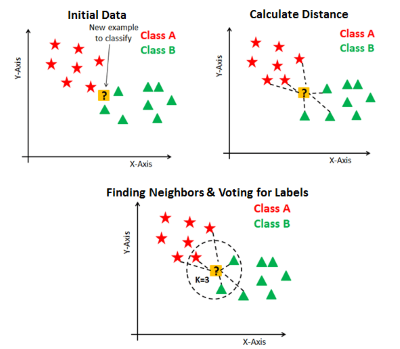

Let $S = (x_1, y_1),...,(x_m,y_m)$ be a sequence of training examples. For each $x∈\chi$, namely for each point in the instance domain, let $\pi_1(x),...,\pi_m(x)$ be a reordering of ${1,...,m}$ according to their distance to $x$.
Then, for every point $x∈\chi$, return the majority label among $\{y_{\pi_i}(x):i\le k\}$

---
For K-Nearest Neighbors, some hyperparameters have been tuned:
* **n_neighbors**: number of neighbors to use. Only odd numbers were considered to avoid situations of parity in majority voting.
* **p**: power parameter for the Minkowski metric $d_p(x, y) = \left(\sum\limits_{i=1}^{n}|x_i-y_i|^p\right)^\frac{1}{p}$. Three particular values for p were tried (p=1, p=2 and p=$\infty$):
    - When p=1, Minkowski metric corresponds to Manhattan distance
    - When p=2, it is equivalent to Euclidean distance
    - When p=$\infty$, we obtain the Chebyshev distance $d_c(x,y) = \underset{i}{\operatorname{max}}(|x_i-y_i|)$
* **weights**: weight function used in prediction. When it is *uniform*, all points in each neighborhood are weighted equally. If it is *distance*, points are weighted by the inverse of their distance. In this case, closer neighbors of a query point will have a greater impact than more distant neighbors.

These results were obtained with the k-fold cross validation, which seems pretty in terms of F1-score:

In [25]:
parameters = {
    'n_neighbors': [1, 3, 5, 7, 11, 15],
    'p': [1, 2, np.inf],
    'weights': ['uniform', 'distance'],
    'n_jobs': [-1]
}

In [26]:
def evaluate_knn(X_train, X_test, y_train, y_test):
    knc = KNeighborsClassifier()
    clf = GridSearchCV(knc, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    print(f"Best cv F1-score: {clf.best_score_:.4f}")
    print(f"Best hyperparameters: {clf.best_params_}")
    return clf

In [27]:
clf_scaled = evaluate_knn(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test)

Best cv F1-score: 0.9460
Best hyperparameters: {'n_jobs': -1, 'n_neighbors': 3, 'p': 2, 'weights': 'uniform'}


Then, the model with the best hyperparameters has been evaluated on the test set, obtaining the relative F1-score and the confusion matrix, for a better interpretation of the result. The test score is even higher than the best cv one.

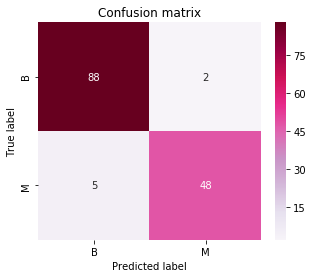

F1 score on test set: 0.9510


In [28]:
y_scaled_pred = clf_scaled.best_estimator_.predict(X_scaled_test)
fig, ax = plt.subplots(figsize = (5,4))
cf_matrix = confusion_matrix(y_scaled_test, y_scaled_pred, labels=["B", "M"])
ax = sns.heatmap(cf_matrix, annot = True, cmap = "PuRd")
ax.set_xticklabels(["B", "M"])
ax.set_yticklabels(["B", "M"])
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion matrix")
plt.show()
f1 = f1_score(y_scaled_test, y_scaled_pred, average="micro")
print(f"F1 score on test set: {f1:.4f}")
variants.append("Normalized")
algorithms.append("K-Nearest-Neighbors")
hyperparameters.append(clf_scaled.best_params_)
best_cv_scores.append(clf_scaled.best_score_)
f1_test_scores.append(f1)

**Learning curves** show the training and testing scores of a model, by varying the number of training samples. It is a tool to find out how much we benefit from adding more training data and whether there is overfitting/underfitting.

Below, the learning curves for the KNN model suggest that at the beginning there is a small overfitting that disappears after that the relative size is 0.5.

In [29]:
fig = learningCurves(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, KNeighborsClassifier, clf_scaled.best_params_)
fig.show()

## 6.2 SVM
**SVM** is a large margin classifier: it tries to find a hyperplane separating the classes in the feature space, maximizing the margin. A separating hyperplane is defined by $(\mathbf{w}, b)$  s.t. $\forall{i},$  $y_i (\langle{\mathbf{w}},\mathbf{x_i}\rangle + b) > 0$, where $y_i \in \{-1,1\}$. While the margin is the distance of the closest examples to the hyperplane: 
$\underset{i}{\operatorname{min}}|\langle{\mathbf{w}}, \mathbf{x_i}\rangle + b|$; these closest examples, which lie on the margin, are called support vectors. They are the only points which are needed to the algorithm to work and for which the parameters  $\alpha_i≠0$  in the dual problem.

In order to find the optimal parameters $(\mathbf{w_0},b_0)$ which describe the largest margin hyperplane, the **Hard-SVM** rule can be formulated as a quadratic optimization problem in its primal form:

$\underset{{(\mathbf{w},b)}}{\operatorname{min}} \frac{1}{2}\left\lVert \mathbf{w}\right\rVert^2$

${s.t.}\ y_i(\langle{\mathbf{w}},\mathbf{x_i}\rangle + b) \geq 1,\ \forall i$

Hard-SVM is suitable for the cases in which data is linearly separable, however this is not a very common situation. For this reason, the Hard-SVM can be relaxed into the **Soft-SVM** rule, which allows for some points to be misclassified. This is the formulation in the primal form:

$\underset{{\mathbf{w}, b}}{\operatorname{min}}\frac{1}{2}\left\lVert \mathbf{w}\right\rVert^2 + C\sum_\limits{i}\xi_i$

${s.t.}\ y_i(\langle{\mathbf{w}},\mathbf{x_i}\rangle + b) \geq 1 - \xi_i,\ \forall i$

$\ \ \ \ \ \ \ \ \xi_i\ge0,\ \forall i$

where $\xi_i$ are the slack variables and $C$ is a regularization parameter that controls the trade-off between margin-maximization (when $C$ is small) and minimization of the slack penalty (when $C$ is high).

When the data is not linearly separable and the separation hyperplane cannot be found even with Soft-SVM, the solution is to map the data into a higher dimensional space, in which it is linearly separable.
As an example, in the image below a 2-dimensional classification is mapped into 3-dimensions using a 2-dimensional Gaussian function.

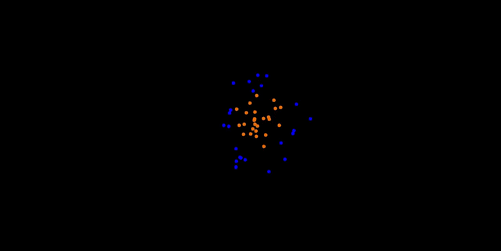


Since choosing a mapping $\phi$ can be very hard, it can be proved that it is enough to consider only the kernel function $K$, without applying the mapping at all. This is the so called **kernel trick**.

In particular, a kernel function for a mapping $\phi$ is a function $K:X\times X → {\rm I\!R}$ that implements inner product in the feature space:
$K(x_i,x_j) = \langle{\phi(x_i)}, \phi(x_j)\rangle$.
Then, the kernel function $K(x_i, x_j)$ is put in place of the scalar product $\langle{x_i},x_j\rangle$ in the dual formulation of the problem:

$\underset{{\alpha}}{\operatorname{max}}\sum_{i} \alpha_i - \frac{1}{2}\sum_{i,j} \alpha_i\alpha_j y_i y_jK(x_i, x_j)$

$s.t.\ \sum_{i}\alpha_i y_i = 0,\ \forall i$

$\ \ \ \ \ \ \ \ \ \alpha_i\ge0,\ \forall i$ (Hard-SVM)

$\ \ \ \ \ \ \ \ \ 0\le\alpha_i\le C,\ \forall i$ (Soft SVM)

Two kernels were considered in this work:
*   the **Polynomial** Kernel:

    $K(x_i,x_j) = (1+\langle{x_i},x_j\rangle)^k$

    where $k$ is the polynomial degree.
    
    
*   the **Radial Basis Function** (Gaussian) Kernel:

    $K(x_i, x_j)=e^{-\gamma\left\lVert x_i - x_j\right\rVert^2}$

    where $\gamma$ can be considered as the spread of the kernel and has effects on the dimension of the decision region. Having a low value for $\gamma$, causes the curvature of the decision boundary to be very low and the decision region to be very broad. When  $\gamma$  is high, the curvature of the decision boundary is high, which creates islands of decision-boundaries around data points.

In [30]:
parameters = {
    "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    "kernel": ["linear", "rbf", "poly"],
    'degree': [2, 3, 5, 10],
    "gamma": ["scale", "auto"]
}

In [31]:
def evaluate_svm(X_train, X_test, y_train, y_test):
    svm = SVC()
    clf = GridSearchCV(svm, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    print(f"Best cv F1-score: {clf.best_score_:.4f}")
    print(f"Best hyperparameters: {clf.best_params_}")
    return clf

---
Below, the hyperparameters tuned for SVM are listed:
* **C**: Regularization parameter in the Soft-Margin formulation.
* **kernel**: One of the two types of kernel described above.
* **degree**: Degree of the polynomial kernel function.
* **gamma**: Kernel coefficient for rbf. If gamma='scale' (default) is passed then it uses $\frac{1}{n\sigma^2}$ as value of gamma, if 'auto', uses $\frac{1}{n}$, where $n$ is the number of features.

The results obtained using SVM with the k-fold cross validation are even better than the KNN ones, in terms of F1-score:

In [32]:
clf_scaled = evaluate_svm(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test)

Best cv F1-score: 0.9765
Best hyperparameters: {'C': 0.1, 'degree': 2, 'gamma': 'scale', 'kernel': 'linear'}


Then, the model with the best hyperparameters has been evaluated on the test set, obtaining the relative F1-score and the confusion matrix, for a better interpretation of the result. The test score is even better than the cv one and the confusion matrix presents no false negatives and very few false positives.

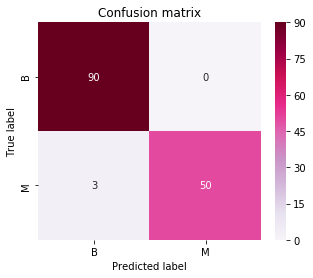

F1 score on test set: 0.9790


In [33]:
y_scaled_pred = clf_scaled.best_estimator_.predict(X_scaled_test)
fig, ax = plt.subplots(figsize = (5,4))
cf_matrix = confusion_matrix(y_scaled_test, y_scaled_pred, labels=["B", "M"])
ax = sns.heatmap(cf_matrix, annot = True, cmap = "PuRd")
ax.set_xticklabels(["B", "M"])
ax.set_yticklabels(["B", "M"])
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion matrix")
plt.show()
f1 = f1_score(y_scaled_test, y_scaled_pred, average="micro")
print(f"F1 score on test set: {f1:.4f}")
variants.append("Normalized")
algorithms.append("Support-Vector-Machines")
hyperparameters.append(clf_scaled.best_params_)
best_cv_scores.append(clf_scaled.best_score_)
f1_test_scores.append(f1)

Below, the learning curves for the SVM model indicate that there is not overfitting.

In [34]:
fig = learningCurves(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, SVC, clf_scaled.best_params_)
fig.show()

## 6.3 Decision Tree
**Decision trees** are simple and easy to interpret non-parametric models, which can be used both for classification and regression tasks. As disadvantages, typically they are not competitive with other methods, they easily overfit and can take a lot of memory.
Decision trees are built by splitting the predictor space into some distinct and non-overlapping regions, which are high-dimensional rectangles. Points in the same region $R$ are all classified with the same label:
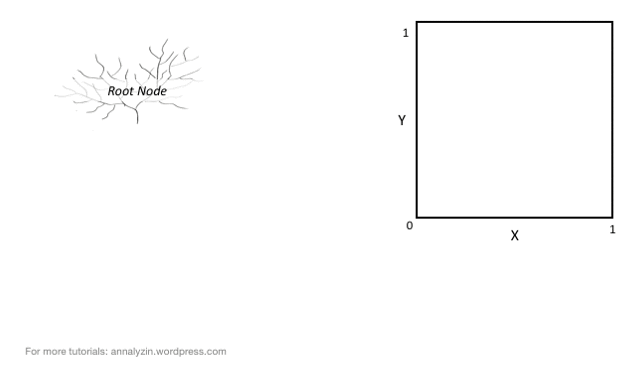
The tree construction adopts a top-down, greedy strategy, known as **recursive binary splitting**: the best attribute for the split is selected locally at each step. So, the best split is found by minimizing the level of node impurity though one of these measures: Gini impurity and cross-entropy.

**Gini impurity** is computed as:

$G = \sum\limits_{k=1}^K{\hat{p}_{mk}(1-\hat{p}_{mk})}$,

where $\hat{p}_{mk}=\frac{|\{x: x\in{R_m}, x\in{C_k}\}|}{|R_m|}$ represents the proportion of training examples in the m-th region that are from the k-th class.

**Cross-entropy** is defined as:

$D = -\sum\limits_{k=1}^K{\hat{p}_{mk}log(\hat{p}_{mk})}$ 

To avoid the problem of overfitting in large trees, some pre-pruning techniques can stop the algorithm before it becomes a fully-grown tree. For instance, the node expansion is stopped when all the instances belong to the same class, when the tree has reached a maximal user-specified depth or when the expansion does not improve impurity measures.

Once the tree has been built, for each testing instance, the label is assigned following the path in the tree. 

In [35]:
parameters = {
    "criterion": ["gini", "entropy"],
    "max_depth": [4, 8, 16, None],
    "random_state": [42],
    "max_features": ["sqrt", "log2", None],
    "min_impurity_decrease": [0, .1, .2]
}

In [36]:
def evaluate_dc(X_train, X_test, y_train, y_test):
    dc = DecisionTreeClassifier()
    clf = GridSearchCV(dc, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    print(f"Best cv F1-score: {clf.best_score_:.4f}")
    print(f"Best hyperparameters: {clf.best_params_}")
    return clf

---
The set of the following hyperparameters have been tuned:
* **criterion**: The purity function to measure the quality of a split (gini or entropy).
* **max_depth**: The maximum depth of the tree.
* **max_features**: The number of features to consider when looking for the best split.
* **min_impurity_decrease**: A node will be split if this split induces a decrease of the impurity greater than or equal to this value.

Below, the results obtained using DecisionTreeClassifier with the k-fold cross validation are presented:

In [37]:
clf_scaled = evaluate_dc(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test)

Best cv F1-score: 0.9506
Best hyperparameters: {'criterion': 'gini', 'max_depth': 8, 'max_features': 'sqrt', 'min_impurity_decrease': 0, 'random_state': 42}


The model with the best hyperparameters has been evaluated on the test set, obtaining the relative F1-score and the confusion matrix, for a better interpretation of the result. The test score has gotten worse than the best cv score and the confusion matrix presents few false negatives and few false positives.

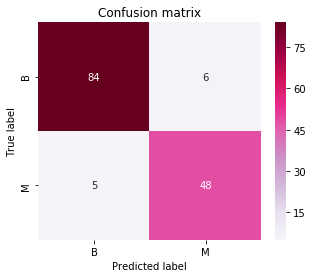

F1 score on test set: 0.9231


In [38]:
y_scaled_pred = clf_scaled.best_estimator_.predict(X_scaled_test)
fig, ax = plt.subplots(figsize = (5,4))
cf_matrix = confusion_matrix(y_scaled_test, y_scaled_pred, labels=["B", "M"])
ax = sns.heatmap(cf_matrix, annot = True, cmap = "PuRd")
ax.set_xticklabels(["B", "M"])
ax.set_yticklabels(["B", "M"])
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion matrix")
plt.show()
f1 = f1_score(y_scaled_test, y_scaled_pred, average="micro")
print(f"F1 score on test set: {f1:.4f}")
variants.append("Normalized")
algorithms.append("Decision Tree")
hyperparameters.append(clf_scaled.best_params_)
best_cv_scores.append(clf_scaled.best_score_)
f1_test_scores.append(f1)

The learning curves show a gap between training and test performances, so it can be noticed the presence of overfitting.

In [39]:
fig = learningCurves(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, DecisionTreeClassifier, clf_scaled.best_params_)
fig.show()

As said before, trees are explainable and easy to interpret. This is due to the fact that with decision trees two visualizations become possible.
The first one is a bar plot about the feature importances, that is how much (in terms of percentages) a feature has relevance in the classification task.

In [40]:
imp_df = pd.DataFrame(data=[clf_scaled.best_estimator_.feature_importances_, scaled_df.columns])
imp_df = imp_df.sort_values(by=0, axis=1, ascending=True)
fig = go.Figure(data=[go.Bar(
        x=imp_df.loc[0,:],
        y=imp_df.loc[1,:],
        orientation='h',
        marker_color='darkcyan',
        name = ""
    )])
fig.update_layout(title_text="Feature importance in percentage", xaxis_title="Importance percentage", yaxis_title="Feature")
fig.show()

The second visualization is about the tree itself:

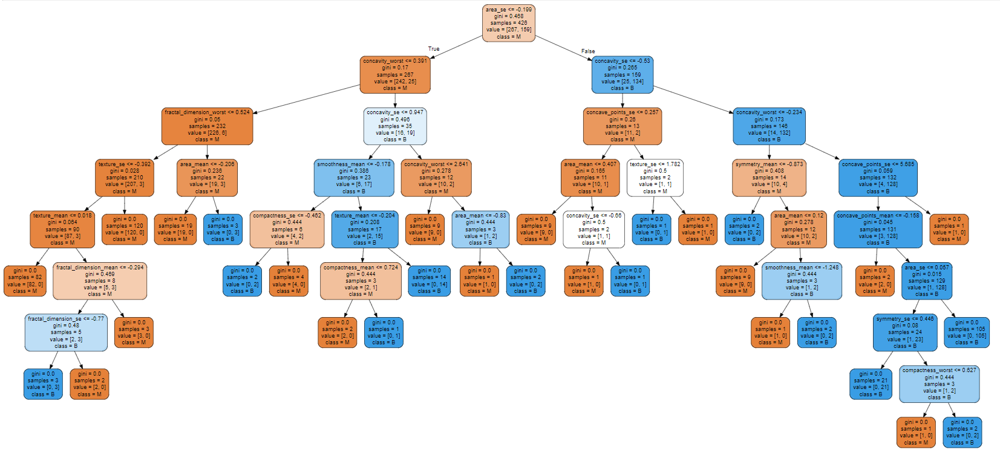

In [41]:
def plotTree(params, X_train, y_train):

    dtc = DecisionTreeClassifier(**params)
    dtc.fit(X_train, y_train)
    
    dot_code = export_graphviz(dtc, out_file=None, 
                      feature_names=scaled_df.columns,  
                      class_names=["M", "B"],  
                      filled=True, rounded=True)
#     print(dot_code)
    pil_img = Image(filename='plotDT_scaled.PNG')
    display(pil_img)
fig = plotTree(clf_scaled.best_params_, X_scaled_train, y_scaled_train)

In both the visualization we notice that the most important feature is area_se, which corresponds to the first node of the structure, followed by its children (concavity_worst and concavity_se).

## 6.4 Random Forest
Random forest is an **ensemble** learning technique, for both classification and regression, which combines multiple decision trees. The combination of several trees can improve accuracy and stability, can offer robustness to noise and outliers, provides global feature importances and can avoid the problem of overfitting.

### 6.4.1 Bagging
Random forest relies on bagging (from **b**ootstrap **agg**regat**ing**), which is a procedure for reducing the variance of a statistical learning method. As a first step in bagging, $B$ different **bootstrapped** training datasets are generated by sampling with replacement from the initial training dataset. Then, each tree is trained on a different bootstrapped training dataset and, at testing time, gives a label prediction. Finally, the overall prediction is made by **majority voting** among the $B$ trees: the label predicted by the ensemble is the most commonly occurring class among the $B$ predictions.

### 6.4.2 Random Forest algorithm
Random forest differs from bagged trees because it selects, for each candidate split in the learning process, a **random subset of the features**. Being $p$ the number of features, $\sqrt{p}$ features are typically selected, however also different numbers can be chosen. The great advantage of this approach is that feature selection makes the trees to be decorrelated. As a consequence, different features could be selected as best attribute for the split, making it possible to construct trees diverse from each others.

To better understand the mechanism, the algorithm is presented below:
* Given a training set $D$ of $n$ instances with $p$ features
* For $b=1,...,B$
    * Sample randomly with replacement $n'<n$ training examples and generate a subset $D_b$
    * Train a decision tree on $D_b$
        * During the tree construction, for each candidate split
            * $m<<p$ random features are selected (typically $m\approx \sqrt{p}$)
            * The best split is computed among these $m$ features
* Class is assigned by majority voting among the $B$ predictions
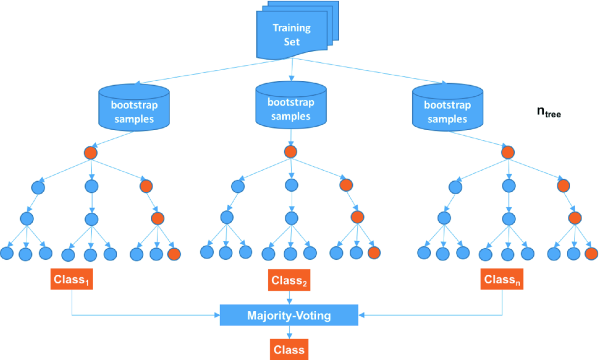

In [42]:
parameters = {
    "n_estimators": [10, 50, 100, 150],
    "criterion": ["gini", "entropy"], 
    "max_depth": [4, 8, 16, None],
    "bootstrap": [True, False],
    "random_state": [42],
    "max_features": ["sqrt", "log2", None],
    "n_jobs": [-1]    
}

In [43]:
def evaluate_rf(X_train, X_test, y_train, y_test):
    rf = RandomForestClassifier()
    clf = GridSearchCV(rf, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    print(f"Best cv F1-score: {clf.best_score_:.4f}")
    print(f"Best hyperparameters: {clf.best_params_}")
    return clf

---
The hyperparameters which have been tuned for Random Forest follows:
* **n_estimators**: The number of trees in the forest.
* **criterion**: The purity function to measure the quality of a split (gini or entropy). This parameter is tree-specific.
* **max_depth**: The maximum depth of the tree.
* **bootstrap**: Whether bootstrap samples are used when building trees. If False, the whole dataset is used to build each tree.
* **max_features**: The number of features to consider when looking for the best split. When it is None, it is the case of bagging.

As expected, the results obtained using random forest with the k-fold cross validation are better than the ones got with decision tree:

In [44]:
clf_scaled = evaluate_rf(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test)

Best cv F1-score: 0.9601
Best hyperparameters: {'bootstrap': False, 'criterion': 'gini', 'max_depth': 16, 'max_features': 'sqrt', 'n_estimators': 10, 'n_jobs': -1, 'random_state': 42}


The model with the best hyperparameters has been evaluated on the test set, obtaining the relative F1-score and the confusion matrix, for a better interpretation of the result. The test score has gotten worse than the best cv score and the confusion matrix presents few false negatives and few false positives.

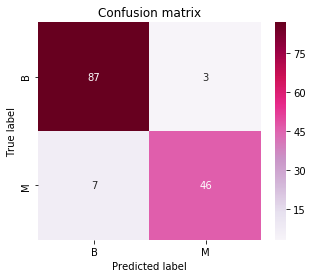

F1 score on test set: 0.9301


In [45]:
y_scaled_pred = clf_scaled.best_estimator_.predict(X_scaled_test)
fig, ax = plt.subplots(figsize = (5,4))
cf_matrix = confusion_matrix(y_scaled_test, y_scaled_pred, labels=["B", "M"])
ax = sns.heatmap(cf_matrix, annot = True, cmap = "PuRd")
ax.set_xticklabels(["B", "M"])
ax.set_yticklabels(["B", "M"])
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion matrix")
plt.show()
f1 = f1_score(y_scaled_test, y_scaled_pred, average="micro")
print(f"F1 score on test set: {f1:.4f}")
variants.append("Normalized")
algorithms.append("Random Forest")
hyperparameters.append(clf_scaled.best_params_)
best_cv_scores.append(clf_scaled.best_score_)
f1_test_scores.append(f1)

The learning curves reveal that the model saturates its learning capability and suggest the presence of slight overfitting, which is reduced with respect to the decision tree case.

In [46]:
fig = learningCurves(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, RandomForestClassifier, clf_scaled.best_params_)
fig.show()

Finally, the bar plot below illustrates the feature importances:

In [47]:
imp_df = pd.DataFrame(data=[clf_scaled.best_estimator_.feature_importances_, scaled_df.columns])
imp_df = imp_df.sort_values(by=0, axis=1, ascending=True)
fig = go.Figure(data=[go.Bar(
        x=imp_df.loc[0,:],
        y=imp_df.loc[1,:],
        orientation='h',
        marker_color='darkcyan',
        name = ""
    )])
fig.update_layout(title_text="Feature importance in percentage", xaxis_title="Importance percentage", yaxis_title="Feature")
fig.show()

Feature importances are not exactly the same as the ones found with decision tree, however it is clear that the area and the concavities on the cells boundaries are determinant in order to distinguish among benign and malignant tumors.

## 6.5 Logistic Regression
Logistic regression is a generalized linear model for classification, instead of regression. Rather than fitting a line, logistic regression fits an S-shaped logistic function, also called **sigmoid**, which goes from 0 to 1. This curve tells which is the conditional probability that in a binary classification problem the class $Y$ is 1, given the predictors $x$ and considering the weights $w$: 

$P(Y=1|x;w) = \frac{e^{\langle{w},x\rangle}}{1+e^{\langle{w},x\rangle}}$

where $h_w(x) = \frac{e^{\langle{w},x\rangle}}{1+e^{\langle{w},x\rangle}}$ is the logistic function.
From another perspective, the inverse of the logistic distribution function, called the logit link, is set equal to the inner product between the weights and the predictors:

$logit(p)=log\frac{p}{1-p}=\langle{w},x\rangle$

During the training phase, it needed to estimate the parameters $w$. To do this, maximum likelihood estimation is exploited. However, it is equivalent to minimize the **logistic loss function**:

$l(h_w,(x,y)) = \log(1 + e^{-y\langle{w},x\rangle})$

Then, in order to find the weights, one of the following optimization problems has to be solved:

* $\underset{w ∈ {\rm I\!R}^{d}}{\operatorname{argmin}}\frac{1}{2}w^Tw + C\sum\limits_{i=1}^{m}\log(1 + e^{-yw^Tx})$, if the chosen penalty is $l_2$

* $\underset{w ∈ {\rm I\!R}^{d}}{\operatorname{argmin}} ||w||_1 + C\sum\limits_{i=1}^{m}\log(1 + e^{-yw^Tx})$, if the chosen penalty is $l_1$

* $\underset{w ∈ {\rm I\!R}^{d}}{\operatorname{argmin}} C\sum\limits_{i=1}^{m}\log(1 + e^{-yw^Tx})$, if no penalty has been specified

where $m$ is the number of training instances.

Once obtained the best estimates $w^*$, at testing time:
* If $h_{w^*(x)} = P(Y=1|x; w^*) \geq 0.5$, it is predicted $Y=1$
* If $h_{w^*(x)} = P(Y=1|x; w^*) < 0.5$, it is predicted $Y=-1$

---
For Logistic Regression these hyperparameters were tuned:
* **penalty**: If it not none, a regularization is applied by adding a penalty in the objective function. The hyperparameter refers to which norm is used in the penalization.
* **C**: Regularization parameter.

The results obtained using logistic regression with the k-fold cross validation are shown:

In [48]:
parameters = {
    "penalty": ["l1", "l2"],
    "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000]
}

In [49]:
def evaluate_lr(X_train, X_test, y_train, y_test):
    lr = LogisticRegression()
    clf = GridSearchCV(lr, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    print(f"Best cv F1-score: {clf.best_score_:.4f}")
    print(f"Best hyperparameters: {clf.best_params_}")
    return clf

In [50]:
clf_scaled = evaluate_lr(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test)

Best cv F1-score: 0.9788
Best hyperparameters: {'C': 1, 'penalty': 'l2'}


The model with the best hyperparameters has been evaluated on the test set, obtaining the relative F1-score and the confusion matrix, for a better interpretation of the result. The test score is very high, better than the cv score, and the confusion matrix presents no false negatives and only two false positives.

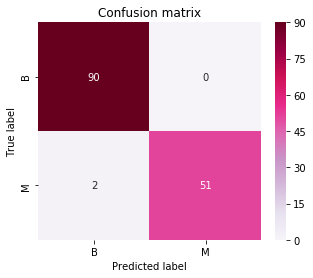

F1 score on test set: 0.9860


In [51]:
y_scaled_pred = clf_scaled.best_estimator_.predict(X_scaled_test)
fig, ax = plt.subplots(figsize = (5,4))
cf_matrix = confusion_matrix(y_scaled_test, y_scaled_pred, labels=["B", "M"])
ax = sns.heatmap(cf_matrix, annot = True, cmap = "PuRd")
ax.set_xticklabels(["B", "M"])
ax.set_yticklabels(["B", "M"])
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.title("Confusion matrix")
plt.show()
f1 = f1_score(y_scaled_test, y_scaled_pred, average="micro")
print(f"F1 score on test set: {f1:.4f}")
variants.append("Normalized")
algorithms.append("Logistic Regression")
hyperparameters.append(clf_scaled.best_params_)
best_cv_scores.append(clf_scaled.best_score_)
f1_test_scores.append(f1)

Below, the learning curves indicate a very good ability of the model in generalizing, because the test learning curve has an increasing trend over the relative training set size and it is very close to the training learning curve.

In [52]:
fig = learningCurves(X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test, LogisticRegression, clf_scaled.best_params_)
fig.show()

In [53]:
def evaluate_variants(variant, X_train, X_test, y_train, y_test):
    #KNN
    parameters = {
    'n_neighbors': [1, 3, 5, 7, 11, 15],
    'p': [1, 2, np.inf],
    'weights': ['uniform', 'distance'],
    'n_jobs': [-1]
    }
    knc = KNeighborsClassifier()
    clf = GridSearchCV(knc, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    y_pred = clf.best_estimator_.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("K-Nearest-Neighbors")
    hyperparameters.append(clf.best_params_)
    best_cv_scores.append(clf.best_score_)
    f1_test_scores.append(f1)
#     priFsnt("knn done")
    
    #SVM
    parameters = {
    "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    "kernel": ["linear", "rbf", "poly"],
    'degree': [2, 3, 5, 10],
    "gamma": ["scale", "auto"]
    }
    svm = SVC()
    clf = GridSearchCV(svm, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    y_pred = clf.best_estimator_.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("Support-Vector-Machines")
    hyperparameters.append(clf.best_params_)
    best_cv_scores.append(clf.best_score_)
    f1_test_scores.append(f1)
#     print("svm done")
    
    #Decision Tree
    parameters = {
    "criterion": ["gini", "entropy"],
    "max_depth": [4, 8, 16, None],
    "random_state": [42],
    "max_features": ["sqrt", "log2", None],
    "min_impurity_decrease": [0, .1, .2]
    }
    dc = DecisionTreeClassifier()
    clf = GridSearchCV(dc, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    y_pred = clf.best_estimator_.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("Decision Tree")
    hyperparameters.append(clf.best_params_)
    best_cv_scores.append(clf.best_score_)
    f1_test_scores.append(f1)
#     print("decision tree done")
    
    #Random Forest
    parameters = {
    "n_estimators": [10, 50, 100, 150],
    "criterion": ["gini", "entropy"], 
    "max_depth": [4, 8, 16, None],
    "bootstrap": [True, False],
    "random_state": [42],
    "max_features": ["sqrt", "log2", None],
    "n_jobs": [-1]    
    }
    rf = RandomForestClassifier()
    clf = GridSearchCV(rf, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    y_pred = clf.best_estimator_.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("Random Forest")
    hyperparameters.append(clf.best_params_)
    best_cv_scores.append(clf.best_score_)
    f1_test_scores.append(f1)
#     print("random forest done")
    
    #Logistic Regression
    parameters = {
    "penalty": ["l1", "l2"],
    "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000]
    }
    lr = LogisticRegression()
    clf = GridSearchCV(lr, parameters, cv=5, scoring="f1_micro", n_jobs=-1)
    clf.fit(X_train, y_train)
    y_pred = clf.best_estimator_.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("Logistic Regression")
    hyperparameters.append(clf.best_params_)
    best_cv_scores.append(clf.best_score_)
    f1_test_scores.append(f1)
#     print("logistic regression done")

In [54]:
def evaluate_variants_smote(variant, X_train, X_test, y_train, y_test):
    #KNN
    parameters = {
    'n_neighbors': [1, 3, 5, 7, 11, 15],
    'p': [1, 2, np.inf],
    'weights': ['uniform', 'distance'],
    'n_jobs': [-1]
    }
    knc = KNeighborsClassifier
    best_score, best_model, best_params = score_model_smote(knc, parameters, X_train, y_train)
    clf = KNeighborsClassifier(**best_params)
    smoter = SMOTE(random_state=42)
    X_train_upsample, y_train_upsample = smoter.fit_resample(X_train, y_train)
    clf.fit(X_train_upsample, y_train_upsample)
#     clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("K-Nearest-Neighbors")
    hyperparameters.append(best_params)
    best_cv_scores.append(best_score)
    f1_test_scores.append(f1)
#     print("knn done")
    
    #SVM
    parameters = {
    "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000],
    "kernel": ["linear", "rbf", "poly"],
    'degree': [2, 3, 5, 10],
    "gamma": ["scale", "auto"]
    }
    svm = SVC
    best_score, best_model, best_params = score_model_smote(svm, parameters, X_train, y_train)
    clf = SVC(**best_params)
    smoter = SMOTE(random_state=42)
    X_train_upsample, y_train_upsample = smoter.fit_resample(X_train, y_train)
    clf.fit(X_train_upsample, y_train_upsample)
#     clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("Support-Vector-Machines")
    hyperparameters.append(best_params)
    best_cv_scores.append(best_score)
    f1_test_scores.append(f1)
#     print("svm done")
    
    #Decision Tree
    parameters = {
    "criterion": ["gini", "entropy"],
    "max_depth": [4, 8, 16, None],
    "random_state": [42],
    "max_features": ["sqrt", "log2", None],
    "min_impurity_decrease": [0, .1, .2]
    }
    dc = DecisionTreeClassifier
    best_score, best_model, best_params = score_model_smote(dc, parameters, X_train, y_train)
    clf = DecisionTreeClassifier(**best_params)
    smoter = SMOTE(random_state=42)
    X_train_upsample, y_train_upsample = smoter.fit_resample(X_train, y_train)
    clf.fit(X_train_upsample, y_train_upsample)
#     clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("Decision Tree")
    hyperparameters.append(best_params)
    best_cv_scores.append(best_score)
    f1_test_scores.append(f1)
#     print("decision tree done")
    
    #Random Forest
    parameters = {
    "n_estimators": [10, 50, 100, 150],
    "criterion": ["gini", "entropy"], 
    "max_depth": [4, 8, 16, None],
    "bootstrap": [True, False],
    "random_state": [42],
    "max_features": ["sqrt", "log2", None],
    "n_jobs": [-1]    
    }
    rf = RandomForestClassifier
    best_score, best_model, best_params = score_model_smote(rf, parameters, X_train, y_train)
    clf = RandomForestClassifier(**best_params)
    smoter = SMOTE(random_state=42)
    X_train_upsample, y_train_upsample = smoter.fit_resample(X_train, y_train)
    clf.fit(X_train_upsample, y_train_upsample)
#     clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("Random Forest")
    hyperparameters.append(best_params)
    best_cv_scores.append(best_score)
    f1_test_scores.append(f1)
#     print("random forest done")
    
    #Logistic Regression
    parameters = {
    "penalty": ["none", "l2"],
    "C": [0.001, 0.01, 0.1, 1, 10, 100, 1000]
    }
    lr = LogisticRegression
    best_score, best_model, best_params = score_model_smote(lr, parameters, X_train, y_train)
    clf = LogisticRegression(**best_params)
    smoter = SMOTE(random_state=42)
    X_train_upsample, y_train_upsample = smoter.fit_resample(X_train, y_train)
    clf.fit(X_train_upsample, y_train_upsample)
#     clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    f1 = f1_score(y_test, y_pred, average="micro")
    variants.append(variant)
    algorithms.append("Logistic Regression")
    hyperparameters.append(best_params)
    best_cv_scores.append(best_score)
    f1_test_scores.append(f1)
#     print("logistic regression done")

In [55]:
# evaluate_variants("Normalized", X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test)
evaluate_variants("LOF", X_lof_train, X_lof_test, y_lof_train, y_lof_test)
evaluate_variants("PCA", X_pca_train, X_pca_test, y_pca_train, y_pca_test)
evaluate_variants_smote("SMOTE", X_scaled_train, X_scaled_test, y_scaled_train, y_scaled_test)
evaluate_variants("LOF+PCA", X_pca_lof_train, X_pca_lof_test, y_pca_lof_train, y_pca_lof_test)
evaluate_variants_smote("PCA+SMOTE", X_pca_train, X_pca_test, y_pca_train, y_pca_test)
evaluate_variants_smote("LOF+SMOTE", X_lof_train, X_lof_test, y_lof_train, y_lof_test)
evaluate_variants_smote("LOF+PCA+SMOTE", X_pca_lof_train, X_pca_lof_test, y_pca_lof_train, y_pca_lof_test)

# 7. Conclusions
In the table below, the performances on the test set are listed for all the models selected after k-fold cross validation, for each scenario, reporting the hyperparameter configuration.

In [56]:
idxs = [] 
for i in range(40):
    ii = "M"+str(i)
    idxs.append(ii)
results_df = pd.DataFrame(list(zip(variants, algorithms, hyperparameters, f1_test_scores)),
               columns =["Data", "Algorithm", "Hyperparameters", "F1_score_test"], index=idxs)
results_df.to_csv("results1.csv")
results_df

,Data,Algorithm,Hyperparameters,F1_score_test
M0,Normalized,K-Nearest-Neighbors,"{'n_jobs': -1, 'n_neighbors': 3, 'p': 2, 'weig...",0.951049
M1,Normalized,Support-Vector-Machines,"{'C': 0.1, 'degree': 2, 'gamma': 'scale', 'ker...",0.979021
M2,Normalized,Decision Tree,"{'criterion': 'gini', 'max_depth': 8, 'max_fea...",0.923077
M3,Normalized,Random Forest,"{'bootstrap': False, 'criterion': 'gini', 'max...",0.930070
M4,Normalized,Logistic Regression,"{'C': 1, 'penalty': 'l2'}",0.986014
M5,LOF,K-Nearest-Neighbors,"{'n_jobs': -1, 'n_neighbors': 1, 'p': 1, 'weig...",0.962963
M6,LOF,Support-Vector-Machines,"{'C': 1, 'degree': 2, 'gamma': 'scale', 'kerne...",0.977778
M7,LOF,Decision Tree,"{'criterion': 'entropy', 'max_depth': 4, 'max_...",0.948148
M8,LOF,Random Forest,"{'bootstrap': True, 'criterion': 'gini', 'max_...",0.970370
M9,LOF,Logistic Regression,"{'C': 1, 'penalty': 'l2'}",0.992593


Then, some visualization are reported below, to summarize the results:

In [57]:
results_df = results_df.sort_values(by="F1_score_test")
fig = go.Figure(data=[go.Bar(
        x=results_df["F1_score_test"],
        y=results_df.reset_index()['index'],
        orientation='h',
        marker_color='darkblue',
        name = ""
    )])
fig.update_layout(title_text="Model comparison through F1 score on test set", xaxis_title="F1-score", yaxis_title="Model",  height = 20*results_df.shape[0],)
fig.show()

In [59]:
res_alg_df = results_df.groupby("Data").mean()
# fig = px.line(res_ald_df, x="index", y="lifeExp", color='country')
# fig.show()
res_alg_df

fig = go.Figure()
# fig.add_trace(go.Scatter(x=res_alg_df.index, y=res_alg_df["F1_score_cv"],
#                     mode='lines+markers',
#                     name='F1_score_cv'))
fig.add_trace(go.Scatter(x=res_alg_df.index, y=res_alg_df["F1_score_test"],
                    mode='lines+markers',
                    name='F1_score_test'))
fig.update_layout(title_text="Average performances per data pre-processing", xaxis_title="Data pre-processing", yaxis_title="F1 score on test set")

fig.show()

In [58]:
res_alg_df = results_df.groupby("Algorithm").mean()
# fig = px.line(res_ald_df, x="index", y="lifeExp", color='country')
# fig.show()
res_alg_df

fig = go.Figure()
# fig.add_trace(go.Scatter(x=res_alg_df.index, y=res_alg_df["F1_score_cv"],
#                     mode='lines+markers',
#                     name='F1_score_cv'))
fig.add_trace(go.Scatter(x=res_alg_df.index, y=res_alg_df["F1_score_test"],
                    mode='lines+markers',
                    name='F1_score_test'))
fig.update_layout(title_text="Average performances per classifier", xaxis_title="Classifier", yaxis_title="F1 score on test set")

fig.show()

Overall, some considerations can be made:
*   the best result on the test set (F1-score=0.9926) is achieved by M9 model, which consists in applying logistic regression on the normalized dataset after outlier removal with LOF technique. In general, all models got very good performances, never below 0.9. 
* among the pre-processing procedures adopted, Local Outlier Factor is the one which allowed the highest scores. The best combination is LOF+PCA, but also LOF alone worked well. On average, the use of LOF in all sequences of data pre-processing improved the scores with respect to the normalized dataset baseline.
* results are not always positively influenced by the use of PCA. This is a confirmation that the dataset under analysis is not affected by the curse of dimensionality, namely the number of predictors is relatively small compared to the number of instances. It is noticeable that on average it is evidently worth using PCA on the dataset only in combination with LOF. In the other cases, it is not convenient also because this would have the negative effect of losing the interpretability of the model.
* applying SMOTE oversampling reported some improvings: on average, SMOTE and LOF+SMOTE reached better scores than the baseline. However, the impact of SMOTE technique would have been much stronger if applied on a very unbalanced dataset (for instance 95/5 percent). In fact, for Breast cancer Wisconsin diagnostic, the dataset imbalance is not severe (about 63/37 percent).
* looking at the line plot of average performances per classifier, one can notice which models performed the best. Overall, random forest and KNN performed well, but logistic regression and SVM performed even better, being the two best algorithms. As regards the decision tree, what has been learned in theory has been confirmed: it guarantees slightly lower performance than other classification methods.
* the analysis was performed on a deterministic split of the data, so it is possible to obtain slightly different results with other splits (not necessarily deterministic), and consequently find different best models.
 
The procedures illustrated in this work cover the main classification algorithms and a lot of visualization tools to explore data, also offering a general framework for data exploration.
This paper has shown how to integrate some preprocessing operations on microscope images of tumoral cells with several different classification models to achieve very good results in tumor classification task. A similar analysis could also be done on a new dataset composed by microscope images, by exploiting some deep learning algorithms, such as Convolutional Neural Networks, which directly work on images, thus avoiding the feature extraction.

# 8. References
Dataset available at: https://archive.ics.uci.edu/ml/datasets/Breast+Cancer+Wisconsin+(Diagnostic)
* https://www.repubblica.it/dossier/salute/saluteseno/2019/01/22/news/tumore_al_seno_in_italia_incidenza_prevalenza_e_sopravvivenza-217182967/
* https://en.wikipedia.org/wiki/Breast_cancer
* https://www.myvmc.com/investigations/fine-needle-aspiration-biopsy-fna/
* https://www.researchgate.net/figure/A-and-B-Invasive-ductal-carcinoma-in-a-breast-fine-needle-aspiration-specimen-from-a_fig5_314102391
* https://en.wikipedia.org/wiki/Fine-needle_aspiration
* W.N. Street, W.H. Wolberg and O.L. Mangasarian. Nuclear feature extraction for breast tumor diagnosis. IS&T/SPIE 1993 International Symposium on Electronic Imaging: Science and Technology, volume 1905, pages 861-870, San Jose, CA, 1993
* https://seaborn.pydata.org/tutorial/distributions.html
* https://en.wikipedia.org/wiki/Occam%27s_razor
* https://towardsdatascience.com/local-outlier-factor-for-anomaly-detection-cc0c770d2ebe
* https://en.wikipedia.org/wiki/Local_outlier_factor
* https://blog.strands.com/unbalanced-datasets
* https://en.wikipedia.org/wiki/Oversampling_and_undersampling_in_data_analysis#SMOTE
* https://rikunert.com/SMOTE_explained
* S. Shalev-Shwartz, S. Ben-David. Understanding machine learning: From theory to algorithms, Cambridge University Press, 2014
* Course slides